# Treinando uma Deep Q Network com TF-Agents

*Nota*: Este notebook é baseado na versão do tutorial "Train a Deep Q Network with TF-Agents" do Tensorflow feita pelos professores Geisa Faustino e João Paulo Navarro da turma de aprendizado por reforço de 2021.


Este notebook mostra como treinar um agente DQN (Deep Q Networks) no ambiente Cartpole usando a biblioteca TF-Agents.

TF-Agents é uma biblioteca para RL em TensorFlow, que facilita projetar, implementar e testar novos algoritmos de RL, oferecendo componentes modulares testados que podem ser modificados e estendidos. Ele permite uma iteração rápida de códigos, com boa integração de teste e comparativo de mercado.

### CartPole

<img src= cartpole.png alt="Cartpole" width=400>

CartPole é um jogo em que um mastro é preso por uma junta não acionada a um carrinho, que se move ao longo de um trilho sem atrito. O mastro começa na posição vertical e o objetivo é evitar que ele caia aumentando e reduzindo a velocidade do carrinho.

Um único estado é composto de 4 elementos:
* posição do carrinho
* velocidade do carrinho
* ângulo do pólo
* velocidade do pólo em sua ponta

Existem duas ações a serem executadas: mover para a esquerda ou para a direita. Para cada passo dado (incluindo o passo terminal), o agente ganha +1 de recompensa. O jogo termina quando o mastro cai, que é quando o ângulo do mastro é superior à ± 12°, ou a posição do carrinho é maior que ± 2,4 (o centro do carrinho atinge a borda da tela). As versões mais recentes do Gym também têm uma restrição de duração que encerra o jogo quando a duração do episódio é maior que 200.

**Referências**:
* [Train a Deep Q Network with TF-Agents](https://www.tensorflow.org/agents/tutorials/1_dqn_tutorial)
* [TF-Agents Doc](https://www.tensorflow.org/agents?hl=pt-br)
* [TF-Agents: A reliable, scalable and easy to use TensorFlow library for Contextual Bandits and Reinforcement Learning](https://github.com/tensorflow/agents)
* [Reinforcement Learning in TensorFlow with TF-Agents (TF Dev Summit '19)](https://www.youtube.com/watch?v=-TTziY7EmUA)
* [Install Tensorflow ](https://www.tensorflow.org/install/pip?hl=pt-br)

### Dependencias

São necessários os pacotes ```tf_agents``` e o pacote ```gymnasium```

In [ ]:
# O runtime do google colab em 2024 precisava deste ajuste para instalar o tf_agents
#   Esta célula provavelmente estará obsoleta em breve
!pip3 uninstall tf-keras -y
!pip3 install tensorflow==2.15.1

In [ ]:
!pip3 install tf_agents


In [ ]:
!pip3 install gymnasium

In [4]:
from __future__ import absolute_import, division, print_function

import base64
import imageio
import IPython
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import PIL.Image

import tensorflow as tf

from tf_agents.agents.dqn import dqn_agent
from tf_agents.environments import suite_gym
from tf_agents.environments import tf_py_environment
from tf_agents.eval import metric_utils
from tf_agents.metrics import tf_metrics
from tf_agents.networks import sequential
from tf_agents.policies import random_tf_policy
from tf_agents.replay_buffers import tf_uniform_replay_buffer
from tf_agents.trajectories import trajectory
from tf_agents.trajectories import TimeStep
from tf_agents.specs import tensor_spec
from tf_agents.utils import common
from tf_agents.trajectories import StepType

from tqdm.notebook import tqdm

import warnings
warnings.filterwarnings('ignore')

import matplotlib.animation as animation
from IPython.display import display
from IPython.display import HTML
import binascii
from io import BytesIO

import gym as og_gym
import gymnasium as gym

# Mais sobre o CartPole

O "Cartpole" corresponde a um clássico problema da teoria de controle, o "pêndulo invertido".

Vamos criar um ambiente desta classe para examiná-lo mais de perto:

In [5]:
env_name = 'CartPole-v0'
env = gym.make(env_name, render_mode="rgb_array")

In [6]:
def mostra_imagem_notebook_html(fig):
  bio = BytesIO()
  fig.canvas.print_png(bio)
  plt.close(fig)
  display(HTML('<img src="data:image/png;base64,{}&#10;">'.format(binascii.b2a_base64(bio.getvalue()).decode())))

Vamos exibir o ambiente em sua configuração inicial:

<IPython.core.display.Javascript object>


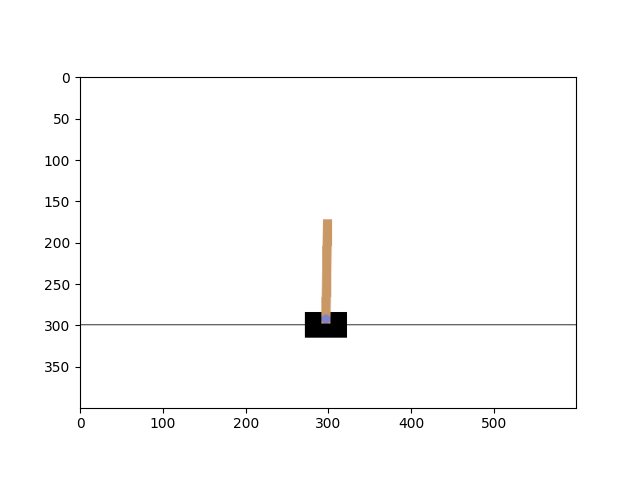

In [7]:
%matplotlib notebook
env.reset()
fig, ax = plt.subplots()
ax.imshow(env.render())
mostra_imagem_notebook_html(fig)

Como mencionado, só são possíveis duas ações sobre este sistema.
A ação de valor "0" empurra o carrinho para a esquerda, a ação de valor "1" empurra o carrinho para a direita.

Vejamos o resultado de uma ação puramente aleatória:

In [8]:
%matplotlib notebook
fig, ax = plt.subplots()
ims = []
env.reset()
done = False
trunc = False
ax.imshow(env.render())  # Imagem inicial
ax.set_title("Cartpole aleatório")
while not done and not trunc:
      _, _, done, trunc, _ = env.step(np.random.choice(2))
      im = ax.imshow(env.render(), animated=True)
      ims.append([im])
ani = animation.ArtistAnimation(fig, ims, interval=100, blit=True,
                                repeat_delay=1000)
HTML(ani.to_jshtml())

<IPython.core.display.Javascript object>

Mesmo uma tentativa simples de controle, por exemplo, "empurre o carrinho na direção do pêndulo", não resolve o problema, o sistema fica instável (este plot está deliberadamente ignorando o término do episódio para explicitar a instabilidade):

In [9]:
%matplotlib notebook
fig, ax = plt.subplots()
ims = []
obs, _ = env.reset()
done = False
trunc = False
ax.imshow(env.render())  # Imagem inicial
ax.set_title("Cartpole com controle simples")
angulo = obs[2]
angulos = [angulo]
#while not done:
for _ in range(200):
      acao = 1 if angulo > 0 else 0
      obs, _, done, trunc, _ = env.step(acao)
      angulo = obs[2]
      im = ax.imshow(env.render(), animated=True)
      ims.append([im])
      angulos.append(angulo)
ani = animation.ArtistAnimation(fig, ims, interval=100, blit=True,
                                repeat_delay=1000)
HTML(ani.to_jshtml())


<IPython.core.display.Javascript object>

## Ambientes e o TensorFlow

A biblioteca TensorFlow tem seus próprios ambientes para aprendizado por reforço. Acesse [Ambientes](https://www.tensorflow.org/agents/tutorials/2_environments_tutorial) para mais detalhes.
Felizmente é possível "envelopar" ambientes "gym" em ambientes TensorFlow.
Infelizmente, estamos usando aqui a nova versão da biblioteca, a "Gymnasium", que tem uma API um pouco diferente.

Para usarmos o cartpole da gymnasium dentro da TensorFlow, é preciso antes "traduzir" a API nova na linguagem da antiga.
A classe a seguir faz isso:

In [10]:
class WrapperAPIAntiga(gym.Wrapper):
  def __init__(self, env):
    super().__init__(env)
    og_os = self.env.observation_space
    og_as = self.env.action_space
    self.observation_space = og_gym.spaces.box.Box(og_os.low, og_os.high, og_os.shape, og_os.dtype)
    self.action_space = og_gym.spaces.discrete.Discrete(og_as.n, start=og_as.start)

  def step(self, action):
    observation, reward, terminated, truncated, info = self.env.step(action)
    return observation, reward, terminated or truncated, info

  def reset(self):
    observation, _ = self.env.reset()
    return observation

  def render(self, mode = None):
    return self.env.render()

Podemos agora criar ambientes TensorFlow a partir de ambientes gymnasium:

In [11]:
train_py_env = suite_gym.wrap_env(gym.make('CartPole-v0'), gym_env_wrappers=(WrapperAPIAntiga,))
eval_py_env = suite_gym.wrap_env(gym.make('CartPole-v0', render_mode="rgb_array"), gym_env_wrappers=(WrapperAPIAntiga,))

Normalmente, dois ambientes são instanciados: um para treinamento e outro para avaliação.

O método `environment.step` executa uma` ação` no ambiente e retorna uma tupla `TimeStep` contendo a próxima observação do ambiente e a recompensa pela ação.

O método `time_step_spec()` retorna a especificação para a tupla `TimeStep`. Seu atributo `observation` mostra a forma das observações, os tipos de dados e os intervalos de valores permitidos. O atributo `reward` mostra os mesmos detalhes para recompensa.

O método `action_spec()` retorna a forma, tipos de dados e valores permitidos das ações válidas.

Os ambientes Python têm um método `step(action) -> next_time_step` que aplica uma ação ao ambiente e retorna as seguintes informações sobre a próxima etapa:`observation`, `reward` `step_type` e `discount`.

No ambiente do Cartpole:

- `observation` é um vetor de 4 floats:
    - a posição e velocidade do carrinho
    - a posição angular e a velocidade do pólo
- `reward` é um escalar (float)
- `action` é um inteiro com apenas dois valores possíveis:
    - `0` -" mover para a esquerda "
    - `1` -" mover para a direita "
- `discount` é um escalar (float) com valor 1 ($\gamma = 1$)

In [12]:
# Mostra o time_step inicial
time_step = eval_py_env.reset()
print('Time step:')
print(time_step)
TimeStep(time_step[0], time_step[1]-time_step[3][0]**2, time_step[2], time_step[3])

Time step:
TimeStep(
{'step_type': array(0, dtype=int32),
 'reward': array(0., dtype=float32),
 'discount': array(1., dtype=float32),
 'observation': array([-0.0436867 , -0.04479486,  0.03056827,  0.02136891], dtype=float32)})


TimeStep(
{'step_type': array(0, dtype=int32),
 'reward': -0.001908527680192798,
 'discount': array(1., dtype=float32),
 'observation': array([-0.0436867 , -0.04479486,  0.03056827,  0.02136891], dtype=float32)})

In [13]:
# Mostra o resultado de uma ação 1 (para a direita)
action = np.array(1, dtype=np.int32)
next_time_step = eval_py_env.step(action)
print('Next time step:')
print(next_time_step)

Next time step:
TimeStep(
{'step_type': array(1, dtype=int32),
 'reward': array(1., dtype=float32),
 'discount': array(1., dtype=float32),
 'observation': array([-0.04458259,  0.14987567,  0.03099565, -0.2615148 ], dtype=float32)})


O ambiente Cartpole, como a maioria dos ambientes, é escrito em Python puro. Isso é convertido em TensorFlow usando o wrapper `TFPyEnvironment`.

A API do ambiente original usa matrizes Numpy. O `TFPyEnvironment` os converte em` Tensores` para torná-los compatíveis com os agentes e políticas do Tensorflow.

In [14]:
train_env = tf_py_environment.TFPyEnvironment(train_py_env)
eval_env = tf_py_environment.TFPyEnvironment(eval_py_env)

In [15]:
print(f'action_spec:{train_py_env.action_spec()}\n')
print(f'time_step_spec.observation:{train_py_env.time_step_spec().observation}\n')
print(f'time_step_spec.step_type:{train_py_env.time_step_spec().step_type}\n')
print(f'time_step_spec.discount:{train_py_env.time_step_spec().discount}\n')
print(f'time_step_spec.reward:{train_py_env.time_step_spec().reward}\n')

action_spec:BoundedArraySpec(shape=(), dtype=dtype('int64'), name='action', minimum=0, maximum=1)

time_step_spec.observation:BoundedArraySpec(shape=(4,), dtype=dtype('float32'), name='observation', minimum=[-4.8000002e+00 -3.4028235e+38 -4.1887903e-01 -3.4028235e+38], maximum=[4.8000002e+00 3.4028235e+38 4.1887903e-01 3.4028235e+38])

time_step_spec.step_type:ArraySpec(shape=(), dtype=dtype('int32'), name='step_type')

time_step_spec.discount:BoundedArraySpec(shape=(), dtype=dtype('float32'), name='discount', minimum=0.0, maximum=1.0)

time_step_spec.reward:ArraySpec(shape=(), dtype=dtype('float32'), name='reward')



## Agente

O algoritmo usado para resolver um problema de RL é representado por um agente. TF-Agents fornece implementações padrão de uma variedade de agentes, incluindo:
-   [DQN](https://storage.googleapis.com/deepmind-media/dqn/DQNNaturePaper.pdf) (o usado neste tutorial)
-   [REINFORCE](https://www-anw.cs.umass.edu/~barto/courses/cs687/williams92simple.pdf)
-   [DDPG](https://arxiv.org/pdf/1509.02971.pdf)
-   [TD3](https://arxiv.org/pdf/1802.09477.pdf)
-   [PPO](https://arxiv.org/abs/1707.06347)
-   [SAC](https://arxiv.org/abs/1801.01290).

O agente DQN pode ser usado em qualquer ambiente que tenha um espaço de ações discreto.

No coração de um Agente DQN está uma `QNetwork`, um modelo de rede neural que pode aprender a prever` QValues` (retornos esperados) para todas as ações, dada uma observação do ambiente.

Usaremos `tf_agents.networks` para criar uma `QNetwork`. A rede consistirá em uma sequência de camadas `tf.keras.layers.Dense`, onde a camada final terá 1 saída para cada ação possível.

### Hiperparâmetros

In [16]:
iteracoes_treinamento = 10000

tamanho_coleta_inicial = 100
collect_steps_per_iteration = 1
replay_buffer_max_length = 100000

tamanho_lote =  64
taxa_aprendizado = 1e-3
intervalo_perdas = 200

num_episodios_aval = 10
intervalo_avaliacoes = 1000

### Exercício:

Usando o Keras, crie uma Q-Network com duas camadas intermediárias lineares de 32 nós plenamente conectadas com função de ativação "Relu" e uma camada de saída linear com 2 nós, correspondentes às duas ações, "empurrar para a esquerda" e "empurrar para a direita", ambas com ativação *linear*.
Estas duas saídas devem prever o valor da fução $q$ para cada uma das ações.

Atribua o resultado da sua rede à variável ```q_net```.

Use como ```kernel_initializer``` o valor
```
tf.keras.initializers.VarianceScaling(scale = 2.0, mode = 'fan_in',distribution = 'truncated_normal')
```

In [17]:
# Complete com seu código
#   você deve atribuir à variável q_net um modelo sequential keras de acordo
#   com as especificações acima.
q_net = sequential.Sequential([
    tf.keras.layers.Dense(
        32,
        activation='relu',
        kernel_initializer=tf.keras.initializers.VarianceScaling(
            scale=2.0, mode='fan_in', distribution='truncated_normal')),
    tf.keras.layers.Dense(
        32,
        activation='relu',
        kernel_initializer=tf.keras.initializers.VarianceScaling(
            scale=2.0, mode='fan_in', distribution='truncated_normal')),
    tf.keras.layers.Dense(
        train_env.action_spec().maximum - train_env.action_spec().minimum + 1,
        activation=None,  # Linear output
        kernel_initializer=tf.keras.initializers.VarianceScaling(
            scale=2.0, mode='fan_in', distribution='truncated_normal')),
])

Agora use `tf_agents.agents.dqn.dqn_agent` para instanciar um `DqnAgent`.
Este é um agente que aprende uma política através do algoritmo DQN.

 Além de `time_step_spec`,` action_spec` e QNetwork, o construtor do agente também requer um otimizador (neste caso, `AdamOptimizer`), uma função de perda e um contador de passos.

In [18]:
otimizador = tf.keras.optimizers.Adam(learning_rate = taxa_aprendizado)

contador_de_passos = tf.Variable(0)

agent = dqn_agent.DqnAgent(train_env.time_step_spec(),
                           train_env.action_spec(),
                           q_network=q_net,
                           optimizer=otimizador,
                           td_errors_loss_fn=common.element_wise_squared_loss,
                           train_step_counter=contador_de_passos)

agent.initialize()

Se você instanciou corretamente a variável ```q_net``` no exercício anterior, o código acima deve executar normalmente.
A rede deve ter 1282 parâmetros.

In [19]:
q_net.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               multiple                  160       
                                                                 
 dense_1 (Dense)             multiple                  1056      
                                                                 
 dense_2 (Dense)             multiple                  66        
                                                                 
Total params: 1282 (5.01 KB)
Trainable params: 1282 (5.01 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


## Política(s)

Uma política define a maneira como um agente atua em um ambiente. Normalmente, o objetivo da aprendizagem por reforço é treinar o modelo subjacente até que a política produza o resultado desejado.

Neste tutorial:

- O resultado desejado é manter o mastro equilibrado na vertical sobre o carrinho.
- A política retorna uma ação (esquerda ou direita) para cada observação `time_step`.

Lembre-se que métodos baseados em Q-Learning são *off-policy*, ou seja, eles usam uma política para explorar o ambiente enquanto aprendem outra política.
Deste modo, os agentes DQN contêm duas políticas:

- `agent.policy` - A política principal usada para avaliação e implantação.
- `agent.collect_policy` - Uma segunda política que é a usada para treinamento.

Mais detalhes sobre as politicas no TF-agent podem ser encontrados [aqui](https://www.tensorflow.org/agents/tutorials/3_policies_tutorial#example_3_q_policy).

In [20]:
eval_policy = agent.policy
collect_policy = agent.collect_policy

In [21]:
print(f'Eval policy: {eval_policy.name}')
print(f'Collect policy: {collect_policy.name}')

Eval policy: greedy_policy
Collect policy: epsilon_greedy_policy


As políticas podem ser criadas independentemente dos agentes. Por exemplo, use `tf_agents.policies.random_tf_policy` para criar uma política que irá selecionar aleatoriamente uma ação para cada` time_step`.

In [22]:
politica_aleatoria = random_tf_policy.RandomTFPolicy(train_env.time_step_spec(),
                                                train_env.action_spec())

Para obter uma ação de uma política, chame o método `policy.action(time_step)`. O `time_step` contém a observação do ambiente. Este método retorna um `PolicyStep`, que é uma tupla nomeada com três componentes:

- `action` - a ação a ser realizada (neste caso,`0` ou `1`)
- `state` - estado
- `info` - dados auxiliares, como probabilidades de log de ações

Este exemplo reinicia o ambiente e mostra 10 resultados da política aleatória.
Você deve ver algum equilíbrio entre ações `0` e `1`.

In [23]:
ambiente_exemplo = tf_py_environment.TFPyEnvironment(suite_gym.wrap_env(gym.make(env_name), gym_env_wrappers=(WrapperAPIAntiga,)))
for i in range(10):
  estado = ambiente_exemplo.reset()
  print(politica_aleatoria.action(estado))

PolicyStep(action=<tf.Tensor: shape=(1,), dtype=int64, numpy=array([0])>, state=(), info=())
PolicyStep(action=<tf.Tensor: shape=(1,), dtype=int64, numpy=array([1])>, state=(), info=())
PolicyStep(action=<tf.Tensor: shape=(1,), dtype=int64, numpy=array([0])>, state=(), info=())
PolicyStep(action=<tf.Tensor: shape=(1,), dtype=int64, numpy=array([0])>, state=(), info=())
PolicyStep(action=<tf.Tensor: shape=(1,), dtype=int64, numpy=array([1])>, state=(), info=())
PolicyStep(action=<tf.Tensor: shape=(1,), dtype=int64, numpy=array([0])>, state=(), info=())
PolicyStep(action=<tf.Tensor: shape=(1,), dtype=int64, numpy=array([1])>, state=(), info=())
PolicyStep(action=<tf.Tensor: shape=(1,), dtype=int64, numpy=array([0])>, state=(), info=())
PolicyStep(action=<tf.Tensor: shape=(1,), dtype=int64, numpy=array([0])>, state=(), info=())
PolicyStep(action=<tf.Tensor: shape=(1,), dtype=int64, numpy=array([1])>, state=(), info=())


## Métricas e Avaliação

A métrica mais comum usada para avaliar uma política é o retorno médio. O retorno é a soma das recompensas obtidas durante a execução de uma política em um ambiente para um episódio. Vários episódios são executados, criando um retorno médio.

A função a seguir calcula o retorno médio de uma política, dada a política, o ambiente e o númedo de episódios.

In [24]:
def calcula_retorno_medio(ambiente, politica, episodios=1):
    total = 0.0
    for _ in range(episodios):
        estado = time_step = ambiente.reset()
        retorno_episodio = 0.0
        escala = 1.0
        while not estado.is_last():
            escala *= estado.discount
            acao = politica.action(estado)
            estado = ambiente.step(acao.action)
            retorno_episodio += estado.reward*escala
        total += retorno_episodio

    retorno_medio = total / episodios
    return retorno_medio.numpy()[0]

Somente para fins de illustração, vamos executar este cálculo na `random_policy` para mostrar um desempenho de linha de base no ambiente.

In [25]:
calcula_retorno_medio(eval_env, politica_aleatoria, num_episodios_aval)

20.6

## Experience Replay Buffer

Um dos aspectos centrais do DQN é o *Experience Replay Buffer*.
O Experience Replay observa os dados coletados do ambiente. É usado para armazenar os pares de observação e ação para que estes possam ser usados no treinamento. Os parâmetros aqui são:
* `data_spec` que especifica o formato das linhas contindas no buffer
* `batch_size` que representa o tamanho do batch que é salvo no buffer
* `max_length` que representa quantos registros o buffer pode conter antes de começar a sobrescrever os mais antigos com as entradas mais recentes.

O Replay Buffer deve ser capaz de retornar amostras *aleatórias* de transições de episódios coletadas previamente.

Este tutorial usa `tf_agents.replay_buffers.tf_uniform_replay_buffer.TFUniformReplayBuffer`, pois é o mais comum.

O construtor requer as especificações dos dados que irá coletar. Isso está disponível no agente usando o método `collect_data_spec`. O tamanho do batch e o comprimento máximo do buffer também são necessários.

Para mais detalhes sobre o buffer de reprodução acesse [ReplayBuffer](https://www.tensorflow.org/agents/tutorials/5_replay_buffers_tutorial).

In [26]:
replay_buffer = tf_uniform_replay_buffer.TFUniformReplayBuffer(data_spec = agent.collect_data_spec,
                                                               batch_size = train_env.batch_size,
                                                               max_length = replay_buffer_max_length)

Para a maioria dos agentes, `collect_data_spec` é uma tupla nomeada chamada` Trajectory`, contendo as especificações para observações, ações, recompensas e outros itens.

In [27]:
agent.collect_data_spec._fields

('step_type',
 'observation',
 'action',
 'policy_info',
 'next_step_type',
 'reward',
 'discount')

In [28]:
agent.collect_data_spec

Trajectory(
{'step_type': TensorSpec(shape=(), dtype=tf.int32, name='step_type'),
 'observation': BoundedTensorSpec(shape=(4,), dtype=tf.float32, name='observation', minimum=array([-4.8000002e+00, -3.4028235e+38, -4.1887903e-01, -3.4028235e+38],
      dtype=float32), maximum=array([4.8000002e+00, 3.4028235e+38, 4.1887903e-01, 3.4028235e+38],
      dtype=float32)),
 'action': BoundedTensorSpec(shape=(), dtype=tf.int64, name='action', minimum=array(0), maximum=array(1)),
 'policy_info': (),
 'next_step_type': TensorSpec(shape=(), dtype=tf.int32, name='step_type'),
 'reward': TensorSpec(shape=(), dtype=tf.float32, name='reward'),
 'discount': BoundedTensorSpec(shape=(), dtype=tf.float32, name='discount', minimum=array(0., dtype=float32), maximum=array(1., dtype=float32))})

## Coletando amostras

Agora execute a política aleatória no ambiente por algumas etapas, gravando os dados no buffer de reprodução.

In [29]:
def coleta_passo(ambiente, politica, buffer):
    antes = ambiente.current_time_step()
    acao = politica.action(antes)
    depois = ambiente.step(acao.action)
    traj = trajectory.from_transition(antes, acao, depois)
    # Adiciona ao buffer
    buffer.add_batch(traj)


def coleta_dados(ambiente, politica, buffer, passos):
    for _ in range(passos):
        coleta_passo(ambiente, politica, buffer)


coleta_dados(train_env, politica_aleatoria, replay_buffer, tamanho_coleta_inicial)

O buffer de reprodução agora é uma coleção de trajetórias.

In [30]:
replay_buffer.num_frames()

<tf.Tensor: shape=(), dtype=int64, numpy=100>

Podemos recuperar um evento *aleatório* dentro da coleção armazenada:

In [31]:
iter(replay_buffer.as_dataset(single_deterministic_pass=False)).next()

Instructions for updating:
Use `as_dataset(..., single_deterministic_pass=False) instead.


(Trajectory(
 {'step_type': <tf.Tensor: shape=(), dtype=int32, numpy=1>,
  'observation': <tf.Tensor: shape=(4,), dtype=float32, numpy=array([-0.06621726, -0.5686185 ,  0.08095371,  0.81962264], dtype=float32)>,
  'action': <tf.Tensor: shape=(), dtype=int64, numpy=0>,
  'policy_info': (),
  'next_step_type': <tf.Tensor: shape=(), dtype=int32, numpy=1>,
  'reward': <tf.Tensor: shape=(), dtype=float32, numpy=1.0>,
  'discount': <tf.Tensor: shape=(), dtype=float32, numpy=1.0>}),
 BufferInfo(ids=<tf.Tensor: shape=(), dtype=int64, numpy=90>, probabilities=<tf.Tensor: shape=(), dtype=float32, numpy=0.01>))

O campo ```BufferInfo``` contém o *número* do evento.
Como foram coletados 100 eventos, este vai ser um valor aleatório de 0 a 99.

Observe que estão presentes o *estado*, no campo `observation`, a ação tomada em `action`

O agente precisa acessar o buffer de reprodução. Isso é fornecido criando de um pipeline `tf.data.Dataset` que fornecerá dados ao agente.

Cada linha do buffer de reprodução armazena apenas um passo de observação.

Um Agente DQN precisa da observação atual e da próxima para calcular a perda, assim esse pipeline irá amostrar duas linhas adjacentes para cada item no batch (`num_steps = 2`).

Este pipeline também é otimizado executando chamadas paralelas e pré-busca de dados.

In [32]:
dataset = replay_buffer.as_dataset(num_parallel_calls = 3,
                                   sample_batch_size = tamanho_lote,
                                   num_steps=2).prefetch(3)

dataset

<_PrefetchDataset element_spec=(Trajectory(
{'step_type': TensorSpec(shape=(64, 2), dtype=tf.int32, name=None),
 'observation': TensorSpec(shape=(64, 2, 4), dtype=tf.float32, name=None),
 'action': TensorSpec(shape=(64, 2), dtype=tf.int64, name=None),
 'policy_info': (),
 'next_step_type': TensorSpec(shape=(64, 2), dtype=tf.int32, name=None),
 'reward': TensorSpec(shape=(64, 2), dtype=tf.float32, name=None),
 'discount': TensorSpec(shape=(64, 2), dtype=tf.float32, name=None)}), BufferInfo(ids=TensorSpec(shape=(64, 2), dtype=tf.int64, name=None), probabilities=TensorSpec(shape=(64,), dtype=tf.float32, name=None)))>

A variável ```dataset``` agora retorna amostras de 64 *pares* de trajetórias para o DQN.

Cada entrada corresponde a um estado anterior, uma ação e um estado subsequente.

Vamos pegar uma amostra deste dataset:

In [33]:
iterator = iter(dataset)
print(iterator)
amostra, _ = iterator.next()

A variável ```amostra```  contém uma trajetória.
A trajetória contém os campos ```observation```, ```action```, ```reward``` e ```discount```

Podemos inspecionar estes campos

In [34]:
print("Número de entradas em observation: " + str(len(amostra.observation)))
print("Número de entradas em action: " + str(len(amostra.action)))
print("Número de entradas em reward: " + str(len(amostra.reward)))
print("Número de entradas em discount: " + str(len(amostra.discount)))

Número de entradas em observation: 64
Número de entradas em action: 64
Número de entradas em reward: 64
Número de entradas em discount: 64


Como se vê, todos eles têm exatamente 64 entradas

Vamos inspecioná-los mais a fundo:

In [35]:
print("observation[0]: " + str(amostra.observation[0]))

observation[0]: tf.Tensor(
[[-0.02761406 -0.1698867   0.05012855  0.04487021]
 [-0.0310118  -0.3656903   0.05102595  0.3529383 ]], shape=(2, 4), dtype=float32)


Há DUAS observações por entrada. O mesmo vale para todos os campos.

O DQN é uma variação do Q-Learning, e neste é necessário observar uma transição $S \rightarrow A \rightarrow R \rightarrow -> S'$, onde $S$ é um estado, $A$ é a ação tomada, $R$ é a recompensa e $S'$ é o estado resultante.

Todos estes atributos estão presentes nas entradas:

In [36]:
print("Estado anterior: " + str(amostra.observation[0][0]))
print("Ação tomada: " + str(amostra.action[0][0]))
print("Recompensa: " + str(amostra.reward[0][0]))
print("Estado posterior: " + str(amostra.observation[0][1]))

Estado anterior: tf.Tensor([-0.02761406 -0.1698867   0.05012855  0.04487021], shape=(4,), dtype=float32)
Ação tomada: tf.Tensor(0, shape=(), dtype=int64)
Recompensa: tf.Tensor(1.0, shape=(), dtype=float32)
Estado posterior: tf.Tensor([-0.0310118  -0.3656903   0.05102595  0.3529383 ], shape=(4,), dtype=float32)


### Exercício:

Calcule a função perda da rede ```q_net``` com essa amostra.

Seja a função $\tilde{q}(S, A)$ a função que aproxima a função $Q(S,A)$.

Então no Q-Learning, o erro observado em uma única transição $S \rightarrow A \rightarrow R \rightarrow S'$ é dado por:

\begin{equation}
E = R + \gamma\, \underset{A'}{\mbox{max}\,} \tilde{q}(S',A') - \tilde{q}(S,A)
\end{equation}

Calcule a média da soma dos quadrados de todos os erros:

In [38]:
erro_total = 0.0
erros = []
for acoes, estados, recompensas, gammas in zip(amostra.action, amostra.observation, amostra.reward, amostra.discount):
  # Valor de R
  recompensa = recompensas[0].numpy()
  # Valor de gamma
  gamma = gammas[0].numpy()
  # Valor previsto para Q(S, A) no estado atual
  valor_previsto = q_net(estados[0:1])[0][0][acoes[0]].numpy()
  # Valor previsto para Q(S', esquerda)
  valor_acao_esquerda = q_net(estados[1:2])[0][0][0].numpy()
  # Valor previsto para Q(S', direita)
  valor_acao_direita = q_net(estados[1:2])[0][0][1].numpy()
  # Complete com seu código

  # Valor máximo entre as ações possíveis em S'
  valor_max_proxima_acao = max(valor_acao_esquerda, valor_acao_direita)
  # Erro
  erro = recompensa + gamma * valor_max_proxima_acao - valor_previsto
  erros.append(erro**2)
  erro_total += erro**2



erro_medio = erro_total/len(amostra.observation)
print(erro_medio)


1.3772865733566049


O seu resultado deve ser igual (dentro de 1\%) ao calculado pelo agente de DQN do TensorFlow:

In [39]:
erro_tf, _ = agent.loss(amostra)
print(erro_tf.numpy())

Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.foldr(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.foldr(fn, elems))


1.363776


## Treinando o Agente

Duas coisas devem acontecer durante o ciclo de treinamento:

- coletar dados do ambiente
- usar esses dados para treinar a(s) rede(s) neural(s) do agente

Este exemplo também avalia periodicamente a política e imprime a pontuação atual.

In [40]:
try:
    %%time
except:
    pass

# Otimização (Optional) Envelopa o código em um grafo tensorflow
agent.train = common.function(agent.train)

# Reseta a contagem de passos
agent.train_step_counter.assign(0)

# Avalia uma vez antes do treinamento
retornos = [calcula_retorno_medio(eval_env, agent.policy, num_episodios_aval)]

for _ in tqdm(range(iteracoes_treinamento)):

    # Coleta dados para o Replay Buffer
    coleta_dados(train_env, agent.collect_policy, replay_buffer, collect_steps_per_iteration)

    # Recupera uma amostra do buffer
    trajetorias, _ = next(iterator)
    perda = agent.train(trajetorias).loss

    step = agent.train_step_counter.numpy()

    if step % intervalo_perdas == 0:
        print('passo = {0}: perdas = {1}'.format(step, perda))

    if step % intervalo_avaliacoes == 0:
        ret = calcula_retorno_medio(eval_env, agent.policy, num_episodios_aval)
        print('passo = {0}: Retorno médio = {1}'.format(step, ret))
        retornos.append(ret)

  0%|          | 0/10000 [00:00<?, ?it/s]

passo = 200: perdas = 11.239147186279297
passo = 400: perdas = 3.8596744537353516
passo = 600: perdas = 13.543380737304688
passo = 800: perdas = 40.27951431274414
passo = 1000: perdas = 42.726036071777344
passo = 1000: Retorno médio = 54.599998474121094
passo = 1200: perdas = 52.9633903503418
passo = 1400: perdas = 13.76198959350586
passo = 1600: perdas = 16.024192810058594
passo = 1800: perdas = 18.03740882873535
passo = 2000: perdas = 531.74072265625
passo = 2000: Retorno médio = 164.60000610351562
passo = 2200: perdas = 211.85101318359375
passo = 2400: perdas = 24.935810089111328
passo = 2600: perdas = 53.96750259399414
passo = 2800: perdas = 348.92266845703125
passo = 3000: perdas = 245.83241271972656
passo = 3000: Retorno médio = 167.1999969482422
passo = 3200: perdas = 45.858612060546875
passo = 3400: perdas = 19.498130798339844
passo = 3600: perdas = 28.474716186523438
passo = 3800: perdas = 67.16834259033203
passo = 4000: perdas = 14.882795333862305
passo = 4000: Retorno médio 

## Visualizando o resultado


### Plots


Usamos o `matplotlib.pyplot` para traçar/desenhar como a política melhorou durante o treinamento.

Uma iteração do `Cartpole-v0` consiste em 200 etapas de tempo. O ambiente dá uma recompensa de `+ 1` para cada passo que a vara se mantém equilibrada, então o retorno máximo para um episódio é 200. Os gráficos mostram o retorno aumentando em direção a esse máximo cada vez que é avaliado durante o treinamento. (Pode ser um pouco instável e não aumentar monotonicamente a cada vez.)

<IPython.core.display.Javascript object>


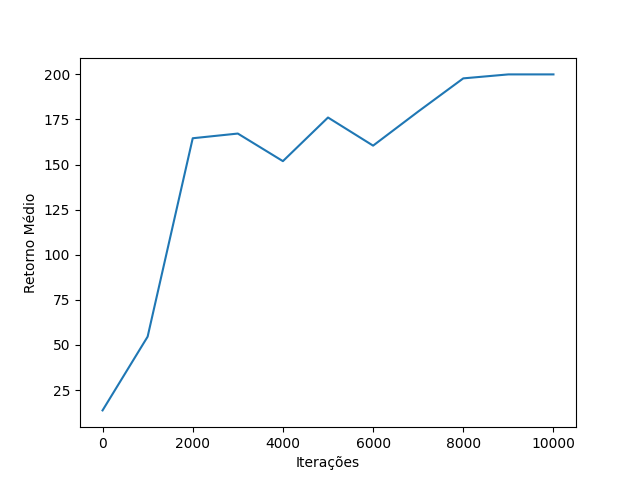

In [41]:
%matplotlib notebook
iteracoes = range(0, iteracoes_treinamento + 1, intervalo_avaliacoes)
fig, ax = plt.subplots()
ax.plot(iteracoes, retornos)
ax.set_ylabel('Retorno Médio')
ax.set_xlabel('Iterações')
mostra_imagem_notebook_html(fig)

### Vídeos

Os gráficos são bons. Mas o mais empolgante é ver um agente realmente executando uma tarefa em um ambiente.


In [42]:
%matplotlib notebook
fig, ax = plt.subplots()
ims = []
time_step = eval_env.reset()
done = False
trunc = False
ax.imshow(eval_env.pyenv.render()[0])  # Imagem inicial
ax.set_title("Cartpole com treinamento por DQN")
while not time_step.is_last():
      action_step = agent.policy.action(time_step)
      time_step = eval_env.step(action_step.action)
      im = ax.imshow(eval_env.pyenv.render()[0], animated=True)
      ims.append([im])
ani = animation.ArtistAnimation(fig, ims, interval=100, blit=True,
                                repeat_delay=1000)
HTML(ani.to_jshtml())

<IPython.core.display.Javascript object>